In [1]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm

In [2]:
# Dataset Class
class MVTecLOCODataset(Dataset):
    def __init__(self, root_dir, split="train", transform=None):
        self.root_dir = root_dir
        self.split = split
        self.transform = transform
        
        # Define the path for the images based on the split
        if self.split == "train":
            self.image_dir = os.path.join(self.root_dir, "train", "good")
        elif self.split == "test":
            self.image_dir = os.path.join(self.root_dir, "test", "good")
        elif self.split == "test2":
            self.image_dir = os.path.join(self.root_dir, "test", "logical_anomalies")
        else:
            raise ValueError("Split must be either 'train', 'test', or 'test2'")
        
        # List all image files in the directory
        self.image_files = [f for f in os.listdir(self.image_dir) if f.endswith(".png")]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        # Load the image
        img_name = os.path.join(self.image_dir, self.image_files[idx])
        image = Image.open(img_name).convert("RGB")  # Assuming 3-channel images

        if self.transform:
            image = self.transform(image)

        return image

In [3]:
# CNN Encoder
class CNN_Encoder(nn.Module):
    def __init__(self, embedding_size, img_size, num_channels):
        super(CNN_Encoder, self).__init__()
        self.channel_mult = 16

        # Convolutional layers
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels=num_channels, out_channels=self.channel_mult, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.channel_mult, self.channel_mult * 2, 4, 2, 1),
            nn.BatchNorm2d(self.channel_mult * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.channel_mult * 2, self.channel_mult * 4, 4, 2, 1),
            nn.BatchNorm2d(self.channel_mult * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.channel_mult * 4, self.channel_mult * 8, 4, 2, 1),
            nn.BatchNorm2d(self.channel_mult * 8),
            nn.LeakyReLU(0.2, inplace=True),
        )

        # Compute the size after convolution layers
        with torch.no_grad():
            test_input = torch.zeros(1, num_channels, img_size, img_size)
            conv_output = self.conv(test_input)
            conv_output_size = conv_output.view(1, -1).size(1)

        self.fc = nn.Sequential(
            nn.Linear(conv_output_size, embedding_size),
            nn.BatchNorm1d(embedding_size),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.conv(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        return x

# CNN Decoder
class CNN_Decoder(nn.Module):
    def __init__(self, embedding_size, img_size, num_channels):
        super(CNN_Decoder, self).__init__()
        self.channel_mult = 16
        self.img_size = img_size
        self.num_channels = num_channels

        # First, compute the size to reshape after the fully connected layer
        self.fc_output_size = self.channel_mult * 8 * (img_size // 16) * (img_size // 16)

        self.fc = nn.Sequential(
            nn.Linear(embedding_size, self.fc_output_size),
            nn.BatchNorm1d(self.fc_output_size),
            nn.ReLU(True),
        )

        # Deconvolutional layers
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(self.channel_mult * 8, self.channel_mult * 4, 4, 2, 1),
            nn.BatchNorm2d(self.channel_mult * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(self.channel_mult * 4, self.channel_mult * 2, 4, 2, 1),
            nn.BatchNorm2d(self.channel_mult * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(self.channel_mult * 2, self.channel_mult, 4, 2, 1),
            nn.BatchNorm2d(self.channel_mult),
            nn.ReLU(True),
            nn.ConvTranspose2d(self.channel_mult, num_channels, 4, 2, 1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.fc(x)
        x = x.view(x.size(0), self.channel_mult * 8, self.img_size // 16, self.img_size // 16)
        x = self.deconv(x)
        return x

# Network combining Encoder and Decoder
class Network(nn.Module):
    def __init__(self, embedding_size, img_size, num_channels):
        super(Network, self).__init__()
        self.encoder = CNN_Encoder(embedding_size, img_size, num_channels)
        self.decoder = CNN_Decoder(embedding_size, img_size, num_channels)

    def forward(self, x):
        z = self.encoder(x)
        reconstructed = self.decoder(z)
        return reconstructed

In [4]:
# Training Function
def train(model, train_loader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    progress_bar = tqdm(train_loader, desc="Training", unit="batch")

    for images in progress_bar:
        images = images.to(device)

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        reconstructed = model(images)
        loss = criterion(reconstructed, images)

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

        # Accumulate the loss
        total_loss += loss.item()
        progress_bar.set_postfix(loss=loss.item())

    return total_loss / len(train_loader)

In [5]:
# Evaluation Function
def evaluate(model, dataloader, device, threshold=None):
    model.eval()
    all_scores = []

    with torch.no_grad():
        for images in dataloader:
            images = images.to(device)

            # Forward pass
            reconstructed = model(images)

            # Compute per-sample reconstruction error (MSE)
            reconstruction_error = nn.functional.mse_loss(reconstructed, images, reduction='none')
            reconstruction_error = reconstruction_error.view(reconstruction_error.size(0), -1)
            reconstruction_error = reconstruction_error.mean(dim=1)

            # Collect reconstruction scores
            all_scores.extend(reconstruction_error.cpu().numpy())

    # Classify as normal or anomalous based on the threshold
    if threshold is not None:
        predictions = [1 if score > threshold else 0 for score in all_scores]
    else:
        predictions = None

    return all_scores, predictions

# Visualization Function
def visualize(model, dataloader, device, num_images=4, save_path=None, show_error=True):
    model.eval()
    images = next(iter(dataloader))
    images = images.to(device)

    with torch.no_grad():
        reconstructed_image = model(images)

    # Convert to NumPy and transpose dimensions for visualization (batch, height, width, channels)
    images = images.cpu().numpy().transpose(0, 2, 3, 1)
    reconstructed_image = reconstructed_image.cpu().numpy().transpose(0, 2, 3, 1)

    # Rescale images from [-1, 1] to [0, 1]
    images = (images * 0.5) + 0.5
    reconstructed_image = (reconstructed_image * 0.5) + 0.5

    # Clip values to ensure valid image range
    images = np.clip(images, 0, 1)
    reconstructed_image = np.clip(reconstructed_image, 0, 1)

    # Compute reconstruction error if needed
    if show_error:
        reconstruction_error = np.mean((images - reconstructed_image) ** 2, axis=(1, 2, 3))

    # Limit to specified number of images
    n = min(len(images), num_images)
    plt.figure(figsize=(18, 8))
    for i in range(n):
        # Original Image
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(images[i])
        ax.axis('off')
        ax.set_title("Original Image")

        # Reconstructed Image
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(reconstructed_image[i])
        ax.axis('off')
        title = "Reconstructed Image"
        if show_error:
            title += f"\nReconstruction Error: {reconstruction_error[i]:.4f}"
        ax.set_title(title)

    # Save or display the plot
    if save_path:
        plt.savefig(save_path)
        print(f"Visualization saved to {save_path}")
    else:
        plt.show()

    plt.close()

No checkpoint found at 'checkpoint_epoch_25.pth'


Training: 100%|██████████| 45/45 [00:46<00:00,  1.03s/batch, loss=0.0741]


Epoch 10/50, Train Loss: 0.073058, Test Reconstruction Error: 0.0651
Epoch 10/50, Test2 Reconstruction Error: 0.0657


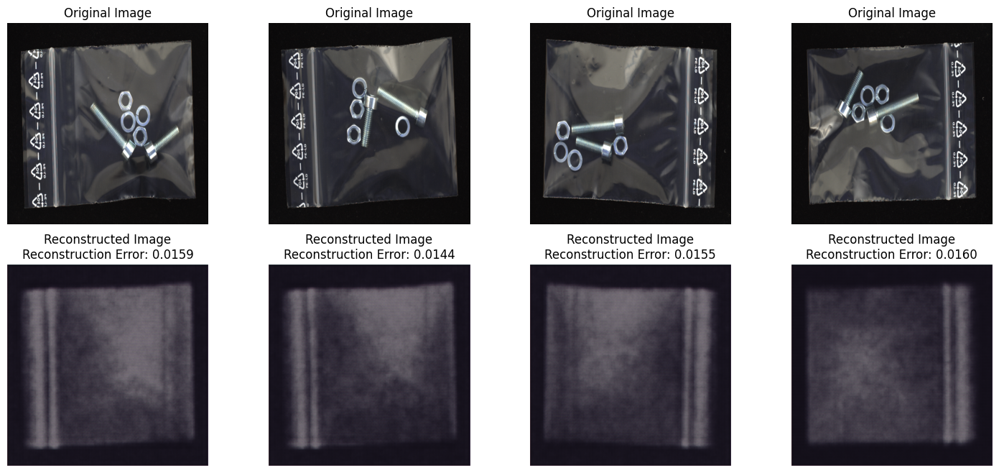

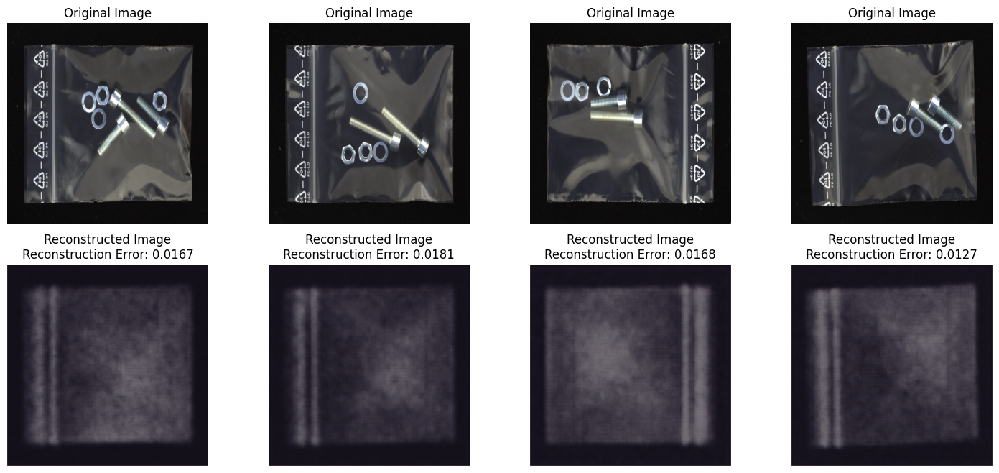

Training: 100%|██████████| 45/45 [00:46<00:00,  1.03s/batch, loss=0.0521]


Epoch 20/50, Train Loss: 0.052026, Test Reconstruction Error: 0.0507
Epoch 20/50, Test2 Reconstruction Error: 0.0532


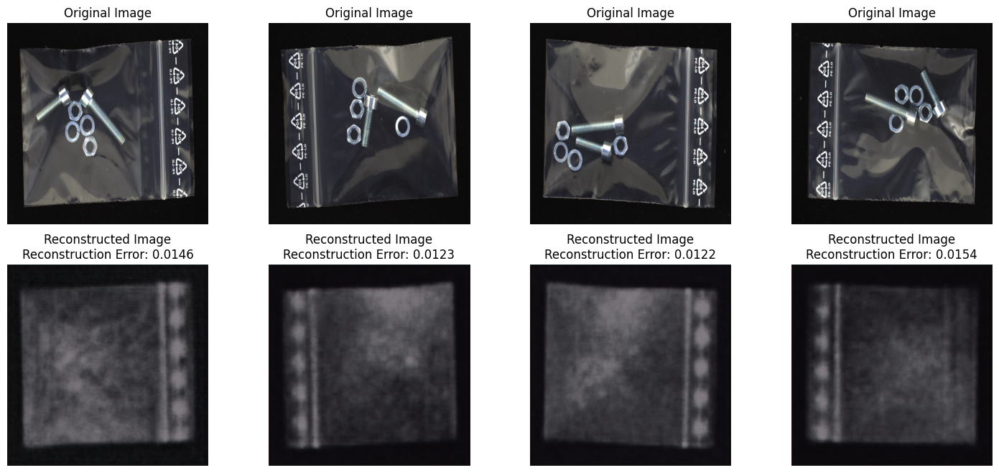

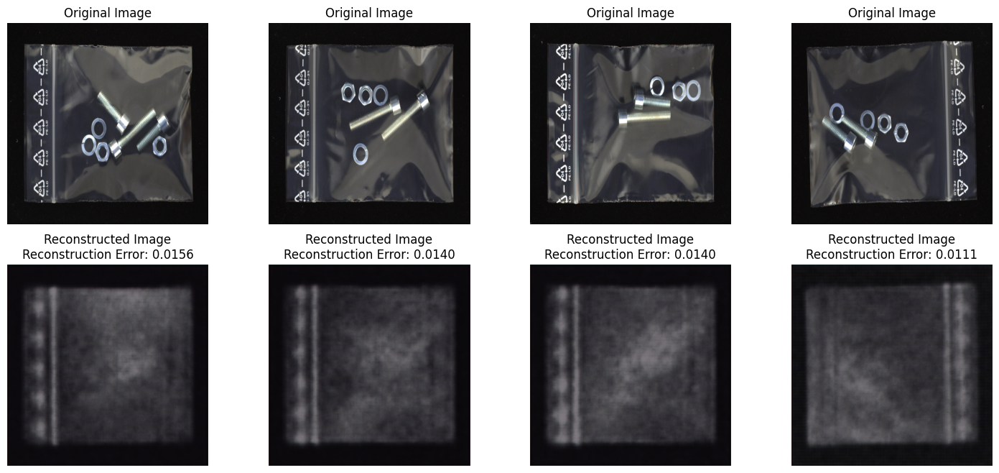

Training: 100%|██████████| 45/45 [00:44<00:00,  1.02batch/s, loss=0.0477]


Checkpoint saved at '11_checkpoint_epoch_25.pth'


Training: 100%|██████████| 45/45 [00:44<00:00,  1.02batch/s, loss=0.05]  


Epoch 30/50, Train Loss: 0.048578, Test Reconstruction Error: 0.0481
Epoch 30/50, Test2 Reconstruction Error: 0.0502


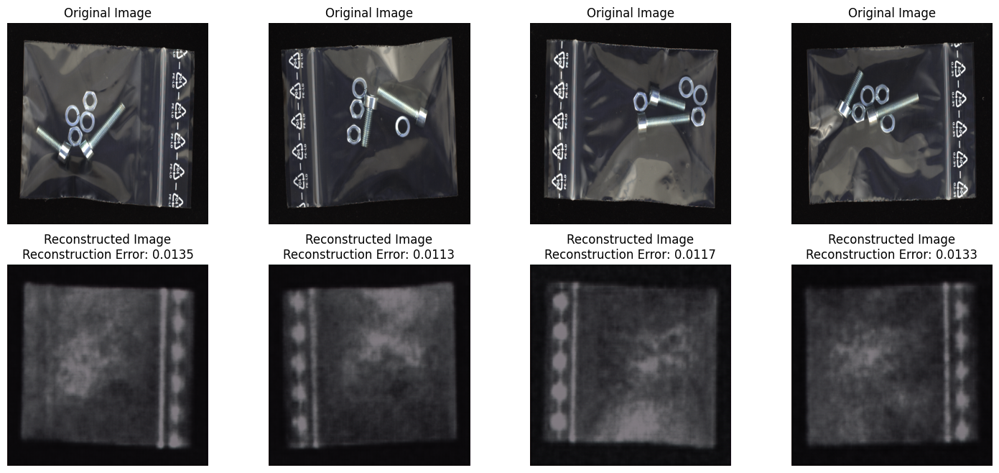

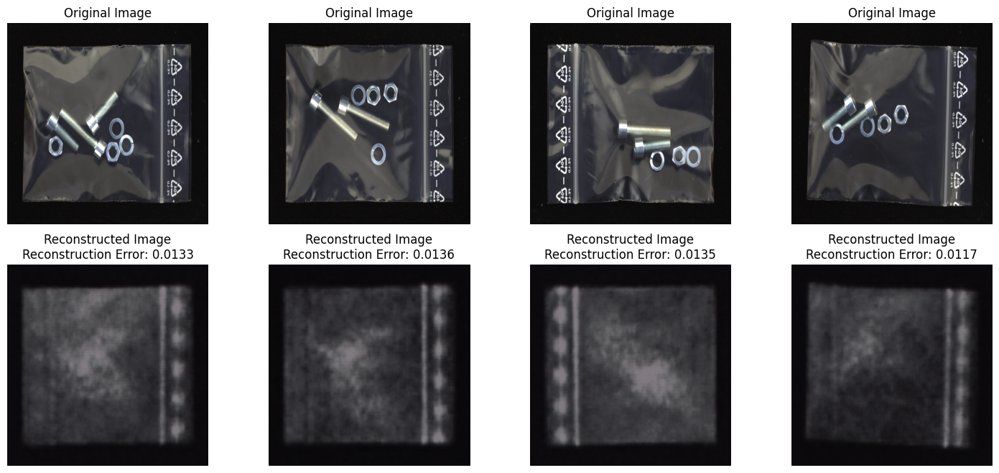

Training: 100%|██████████| 45/45 [00:45<00:00,  1.00s/batch, loss=0.0452]


Epoch 40/50, Train Loss: 0.045333, Test Reconstruction Error: 0.0457
Epoch 40/50, Test2 Reconstruction Error: 0.0475


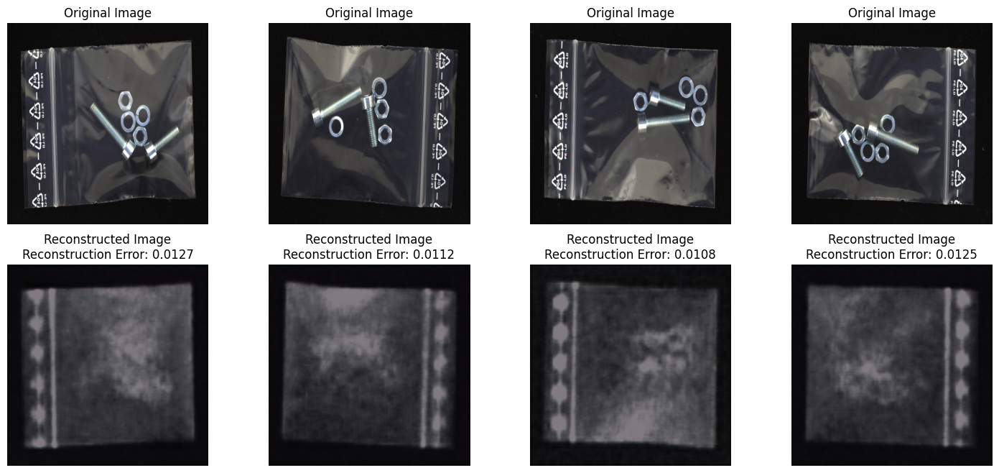

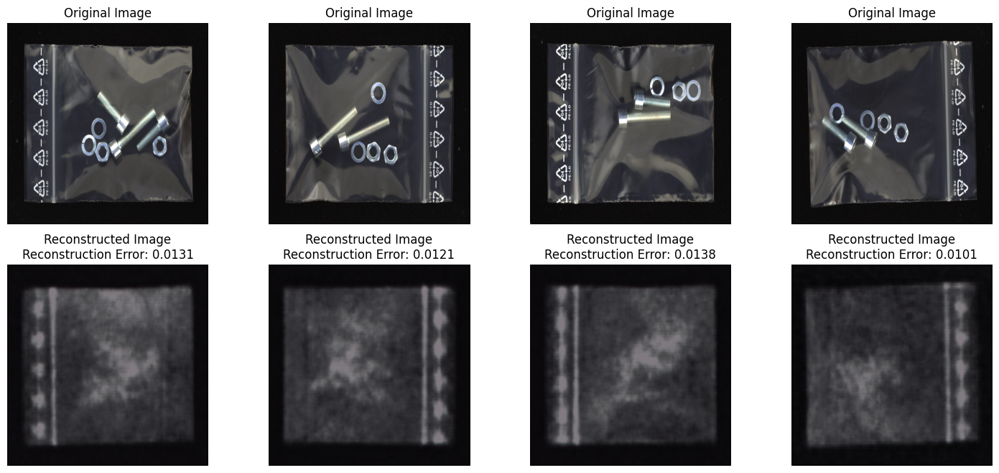

Training: 100%|██████████| 45/45 [00:45<00:00,  1.01s/batch, loss=0.0465]


Epoch 50/50, Train Loss: 0.043005, Test Reconstruction Error: 0.0441
Epoch 50/50, Test2 Reconstruction Error: 0.0451


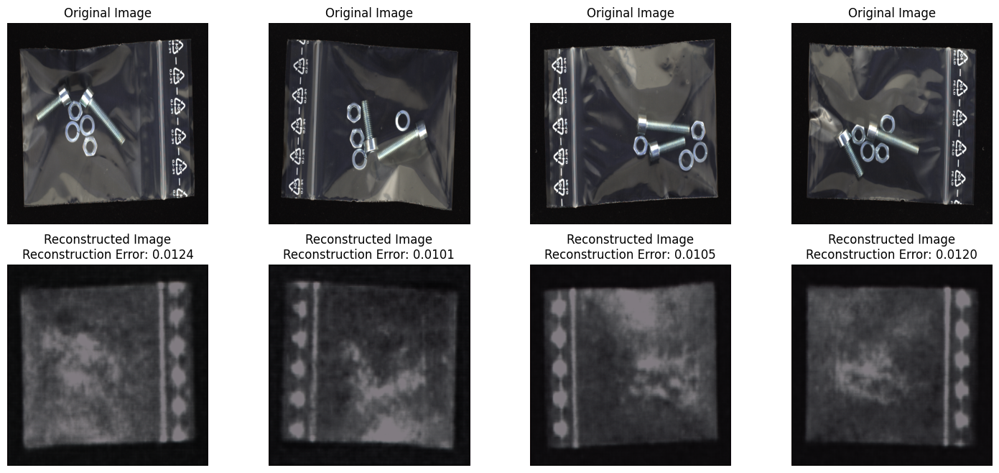

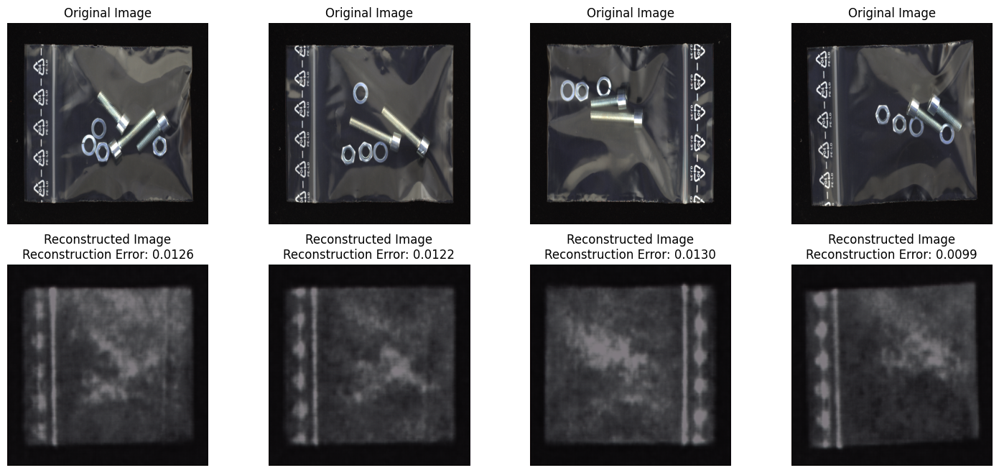

Checkpoint saved at '11_checkpoint_epoch_50.pth'
Checkpoint saved at 'model_final.pth'


In [6]:
# Checkpoint Save Function
def save_checkpoint(epoch, model, optimizer, checkpoint_path):
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
    }, checkpoint_path)
    print(f"Checkpoint saved at '{checkpoint_path}'")

# Checkpoint Load Function
def load_checkpoint(checkpoint_path, model, optimizer, device):
    if os.path.isfile(checkpoint_path):
        print(f"Loading checkpoint from '{checkpoint_path}'")
        checkpoint = torch.load(checkpoint_path, map_location=device)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        start_epoch = checkpoint['epoch'] + 1
        print(f"Resuming training from epoch {start_epoch}")
        return start_epoch
    else:
        print(f"No checkpoint found at '{checkpoint_path}'")
        return 0

# Main Function
def main():
    # Hyperparameters
    img_size = 1024  # Adjusted to fit in memory
    num_channels = 3
    batch_size = 8
    num_epochs = 50
    learning_rate = 1e-4
    ROOT_DIR = "/home/hafiz/my_thesis/seg_recons/dataset/screw_bag"
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

    # Data Transformations
    transform = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5] * num_channels, std=[0.5] * num_channels),
    ])

    # Datasets and Data Loaders
    train_dataset = MVTecLOCODataset(root_dir=ROOT_DIR, split='train', transform=transform)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    test_dataset = MVTecLOCODataset(root_dir=ROOT_DIR, split='test', transform=transform)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    test_dataset2 = MVTecLOCODataset(root_dir=ROOT_DIR, split='test2', transform=transform)
    test_loader2 = DataLoader(test_dataset2, batch_size=batch_size, shuffle=False)

    embedding_size = 128
    model = Network(embedding_size=embedding_size, img_size=img_size, num_channels=num_channels).to(device)

    # Optimizer and Loss Function
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.MSELoss(reduction='mean')

    # Load checkpoint if available
    checkpoint_path = 'checkpoint_epoch_25.pth'
    start_epoch = load_checkpoint(checkpoint_path, model, optimizer, device)

    # Training Loop
    for epoch in range(start_epoch, num_epochs):
        # Train
        train_loss = train(model, train_loader, optimizer, criterion, device)

        # Evaluate and Visualize every 10 epochs
        if (epoch + 1) % 10 == 0:
            # Evaluate on test set
            all_scores, predictions = evaluate(model, test_loader, device)
            mean_score = np.mean(all_scores) if all_scores else 0
            print(f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_loss:.6f}, Test Reconstruction Error: {mean_score:.4f}")

            # Evaluate on test2 set
            all_scores2, predictions2 = evaluate(model, test_loader2, device)
            mean_score2 = np.mean(all_scores2) if all_scores2 else 0
            print(f"Epoch {epoch + 1}/{num_epochs}, Test2 Reconstruction Error: {mean_score2:.4f}")

            # Visualize
            visualize(model, test_loader, device, num_images=4)
            visualize(model, test_loader2, device, num_images=4)

        # Save checkpoint every 25 epochs
        if (epoch + 1) % 25 == 0:
            save_checkpoint(epoch, model, optimizer, f'11_checkpoint_epoch_{epoch + 1}.pth')

    # Save final model
    save_checkpoint(num_epochs, model, optimizer, 'model_final.pth')

if __name__ == "__main__":
    main()